In [1]:
# импортируем все что нужно
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import random

In [2]:
# важно! ноутук должен лежать в той же папке что и папка archive, где хранятся все изначальные данные
notebook_path = Path.cwd()
data_path = notebook_path / "archive"

In [3]:
# пути до всех необходимых файлов

attr_path = data_path / "list_attr_celeba.csv"
bbox_path = data_path / "list_bbox_celeba.csv"
landmark_path = data_path / "list_landmarks_celeba.txt"
identity_path = data_path / "identity_CelebA.txt"

In [4]:
# читаем атрибуты
df_attr = pd.read_csv(attr_path)
print(df_attr.shape)
df_attr.head()

(202599, 41)


,image_id,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,...,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
0,000001.jpg,-1,1,1,-1,-1,-1,-1,-1,-1,...,-1,1,1,-1,1,-1,1,-1,-1,1
1,000002.jpg,-1,-1,-1,1,-1,-1,-1,1,-1,...,-1,1,-1,-1,-1,-1,-1,-1,-1,1
2,000003.jpg,-1,-1,-1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,1,-1,-1,-1,-1,-1,1
3,000004.jpg,-1,-1,1,-1,-1,-1,-1,-1,-1,...,-1,-1,1,-1,1,-1,1,1,-1,1
4,000005.jpg,-1,1,1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,-1,-1,-1,1,-1,-1,1


In [5]:
# читаем bounding boxes
df_bbox = pd.read_csv(bbox_path)
print(df_bbox.shape)
df_bbox.head()

(202599, 5)


,image_id,x_1,y_1,width,height
0,000001.jpg,95,71,226,313
1,000002.jpg,72,94,221,306
2,000003.jpg,216,59,91,126
3,000004.jpg,622,257,564,781
4,000005.jpg,236,109,120,166


In [6]:
# читаем landmarks

columns_landmark = [
    "image_id",
    "lefteye_x", "lefteye_y",
    "righteye_x", "righteye_y",
    "nose_x", "nose_y",
    "leftmouth_x", "leftmouth_y",
    "rightmouth_x", "rightmouth_y"
]

df_landmark = pd.read_csv(
    landmark_path,          # path to your txt file
    sep=r"\s+",           # whitespace-separated
    skiprows=2,           # skip first two lines
    names=columns_landmark
)

print(df_landmark.shape)
df_landmark.head()

(202599, 11)


,image_id,lefteye_x,lefteye_y,righteye_x,righteye_y,nose_x,nose_y,leftmouth_x,leftmouth_y,rightmouth_x,rightmouth_y
0,000001.jpg,165,184,244,176,196,249,194,271,266,260
1,000002.jpg,140,204,220,204,168,254,146,289,226,289
2,000003.jpg,244,104,264,105,263,121,235,134,251,140
3,000004.jpg,796,539,984,539,930,687,762,756,915,756
4,000005.jpg,273,169,328,161,298,172,283,208,323,207


In [7]:
# читаем identity

columns_identity = [
    "image_id",
    "identity"
]

df_identity = pd.read_csv(
    identity_path,          # path to your txt file
    sep=r"\s+",           # whitespace-separated
    names=columns_identity
)


print(df_identity.shape)
df_identity.head()

(202599, 2)


,image_id,identity
0,000001.jpg,2880
1,000002.jpg,2937
2,000003.jpg,8692
3,000004.jpg,5805
4,000005.jpg,9295


In [8]:
# посмотрим как часто встречаются разные identity
identity_counts = df_identity['identity'].value_counts()
identity_counts[0:20]

identity
3227    35
3782    35
2820    35
3699    34
3745    34
9152    32
8968    32
9256    32
4887    31
6568    31
4126    31
4740    31
4262    31
4978    31
9840    31
1757    31
2114    31
4905    30
8692    30
4153    30
Name: count, dtype: int64

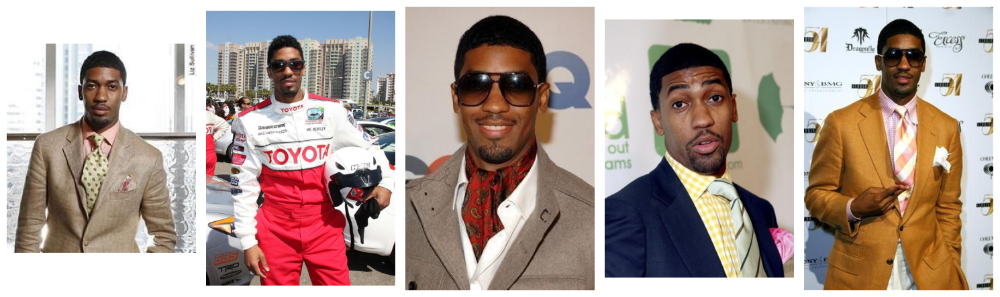

In [9]:
# написуем самую частую identity и выведем 5 случайных изображений с ней, ради забавы

most_common_identity = identity_counts.index[0]
image_ids_most_common_identity = df_identity[df_identity['identity'] == most_common_identity]['image_id'].tolist()

fig, axs = plt.subplots(1, 5, figsize=(15, 5))

random.shuffle(image_ids_most_common_identity)

for ax_img, image_id in zip(axs, image_ids_most_common_identity[:5]):

    matches = list(data_path.rglob(image_id))
    img_path = matches[0]
    img = Image.open(img_path).convert("RGB")
    ax_img.imshow(img)
    ax_img.axis("off")

plt.tight_layout()

Без понятия, что за чувак, ну ладно :)

In [10]:
# глянем сколько всего уникальных identity в датасете
df_identity['identity'].nunique()

10177

Text(0.5, 1.0, 'Distribution of Images per Identity')

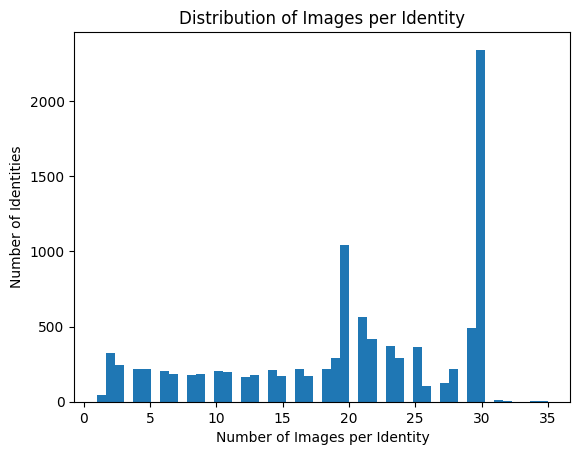

In [11]:
# построим гистограмму распределения количества изображений по identity
plt.hist(identity_counts, bins=50)
plt.xlabel("Number of Images per Identity")
plt.ylabel("Number of Identities")
plt.title("Distribution of Images per Identity")

In [12]:
# глянем сколько indentities имеют больше 25 изображений
num_identities = (identity_counts > 25).sum()
num_identities

np.int64(3300)

видно, что у нас есть куча identities с количеством изображений больше 25 изображений, что хорошо для Face Recognition

In [13]:
# мерджим все датафреймы в один большой

df = df_attr.merge(df_bbox, on="image_id", how="inner")
df = df.merge(df_landmark, on="image_id", how="inner")
df = df.merge(df_identity, on="image_id", how="inner")
print(df.shape)
df.head()

(202599, 56)


,image_id,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,...,lefteye_y,righteye_x,righteye_y,nose_x,nose_y,leftmouth_x,leftmouth_y,rightmouth_x,rightmouth_y,identity
0,000001.jpg,-1,1,1,-1,-1,-1,-1,-1,-1,...,184,244,176,196,249,194,271,266,260,2880
1,000002.jpg,-1,-1,-1,1,-1,-1,-1,1,-1,...,204,220,204,168,254,146,289,226,289,2937
2,000003.jpg,-1,-1,-1,-1,-1,-1,1,-1,-1,...,104,264,105,263,121,235,134,251,140,8692
3,000004.jpg,-1,-1,1,-1,-1,-1,-1,-1,-1,...,539,984,539,930,687,762,756,915,756,5805
4,000005.jpg,-1,1,1,-1,-1,-1,1,-1,-1,...,169,328,161,298,172,283,208,323,207,9295


In [14]:
# создаем словарь для удобного доступа к координатам landmark'ов

landmarks = {
    "lefteye": ("lefteye_x", "lefteye_y"),
    "righteye": ("righteye_x", "righteye_y"),
    "nose": ("nose_x", "nose_y"),
    "leftmouth": ("leftmouth_x", "leftmouth_y"),
    "rightmouth": ("rightmouth_x", "rightmouth_y"),
}

  point: (203, 137)
  point: (250, 128)
  point: (214, 165)
  point: (221, 193)
  point: (261, 185)


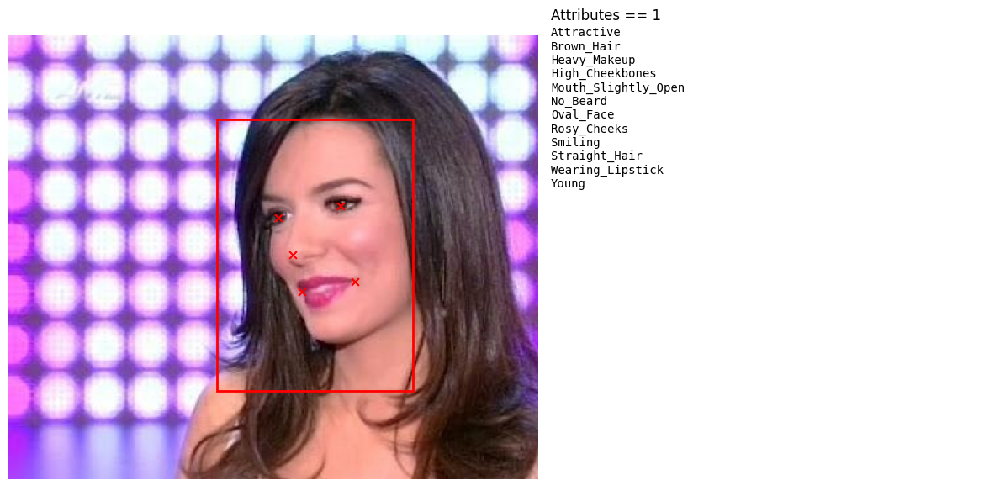

In [15]:
# нарисуем случайную картинку с bbox, landmark'ами и атрибутами, чтобы убедиться что все ок

random_idx = random.randint(0, df.shape[0] - 1)

row = df.iloc[random_idx]

image_id = str(row["image_id"])


matches = list(data_path.rglob(image_id))
img_path = matches[0]

img = Image.open(img_path).convert("RGB")
W, H = img.size

x = int(row["x_1"]); y = int(row["y_1"])
w = int(row["width"]); h = int(row["height"])


x1 = max(0, x )
y1 = max(0, y )
x2 = min(W, x + w )
y2 = min(H, y + h)

exclude = {"image_id", "x_1", "y_1", "width", "height"}
attr_cols = [c for c in df.columns if c not in exclude]
positive_attrs = [c for c in attr_cols if int(row[c]) == 1]

fig = plt.figure(figsize=(12, 6))
gs = fig.add_gridspec(1, 2, width_ratios=[1.2, 1])

ax_img = fig.add_subplot(gs[0, 0])
ax_txt = fig.add_subplot(gs[0, 1])

ax_img.imshow(img)
rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, linewidth=2, edgecolor="red")
ax_img.add_patch(rect)
ax_img.axis("off")

ax_txt.axis("off")
ax_txt.set_title("Attributes == 1", loc="left")
text = "\n".join(positive_attrs) if positive_attrs else "(none)"
ax_txt.text(0.0, 1.0, text, va="top", ha="left", fontsize=10, family="monospace")

for name, (cx, cy) in landmarks.items():
    lx = int(row[cx])
    ly = int(row[cy])

    # landmarks заданы в системе координат bbox -> переводим в координаты изображения
    px = lx
    py = ly

    print(f"  point: ({px}, {py})")

    # на всякий случай ограничим границами изображения
    px = max(0, min(W - 1, px))
    py = max(0, min(H - 1, py))

    # нарисуем landmarks
    ax_img.scatter([px], [py], s=40, marker="x", linewidths=1.5, color = "red")


plt.tight_layout()
plt.show()

In [16]:
# анализ распределения атрибутов в датасете
attr_cols = [c for c in df_attr.columns if c != "image_id"]
print(f"Number of attributes: {len(attr_cols)}")
for c in attr_cols:
    num_pos = (df_attr[c] == 1).sum()
    num_neg = (df_attr[c] == -1).sum()
    print(f"{c:20s}: pos {num_pos} - {(num_pos / df_attr.shape[0] * 100.0):.2f}% / neg {num_neg} - {(num_neg / df_attr.shape[0] * 100.0):.2f}% / total {num_pos + num_neg}")

Number of attributes: 40
5_o_Clock_Shadow    : pos 22516 - 11.11% / neg 180083 - 88.89% / total 202599
Arched_Eyebrows     : pos 54090 - 26.70% / neg 148509 - 73.30% / total 202599
Attractive          : pos 103833 - 51.25% / neg 98766 - 48.75% / total 202599
Bags_Under_Eyes     : pos 41446 - 20.46% / neg 161153 - 79.54% / total 202599
Bald                : pos 4547 - 2.24% / neg 198052 - 97.76% / total 202599
Bangs               : pos 30709 - 15.16% / neg 171890 - 84.84% / total 202599
Big_Lips            : pos 48785 - 24.08% / neg 153814 - 75.92% / total 202599
Big_Nose            : pos 47516 - 23.45% / neg 155083 - 76.55% / total 202599
Black_Hair          : pos 48472 - 23.93% / neg 154127 - 76.07% / total 202599
Blond_Hair          : pos 29983 - 14.80% / neg 172616 - 85.20% / total 202599
Blurry              : pos 10312 - 5.09% / neg 192287 - 94.91% / total 202599
Brown_Hair          : pos 41572 - 20.52% / neg 161027 - 79.48% / total 202599
Bushy_Eyebrows      : pos 28803 - 14.22% /

In [17]:
# функция для отображения 5 случайных изображений с заданным атрибутом == 1
# сделано чтобы быстро глянуть на примеры изображений с определенным атрибутом
def show_5_row_by_attribute(df, data_path, attribute_name, n, seed):

    candidates = df[df[attribute_name] == 1]

    n = min(n, len(candidates))
    rng = np.random.default_rng(seed)
    sampled_idx = rng.choice(candidates.index.to_numpy(), size=n, replace=False)

    fig, axes = plt.subplots(1, n, figsize=(4 * n, 4))

    for ax, idx in zip(axes, sampled_idx):

        row = df.loc[idx]
        image_id = str(row["image_id"])

        matches = list(data_path.rglob(image_id))

        img_path = matches[0]
        img = Image.open(img_path).convert("RGB")

        W, H = img.size

        x = int(row["x_1"]); y = int(row["y_1"])
        w = int(row["width"]); h = int(row["height"])

        x1 = max(0, x )
        y1 = max(0, y )
        x2 = min(W, x + w )
        y2 = min(H, y + h)

        ax.imshow(img)
        rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, linewidth=2, edgecolor="red")
        ax.add_patch(rect)

        ax.axis("off")
        ax.set_title(f"{attribute_name} = 1", fontsize=12)

    plt.tight_layout()
    plt.show()

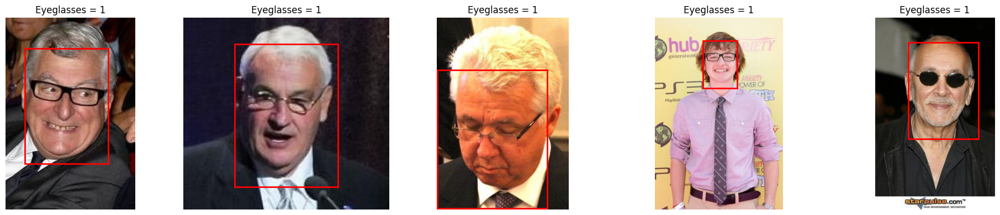

In [18]:
show_5_row_by_attribute(df, data_path, "Eyeglasses", n = 5, seed = 21)

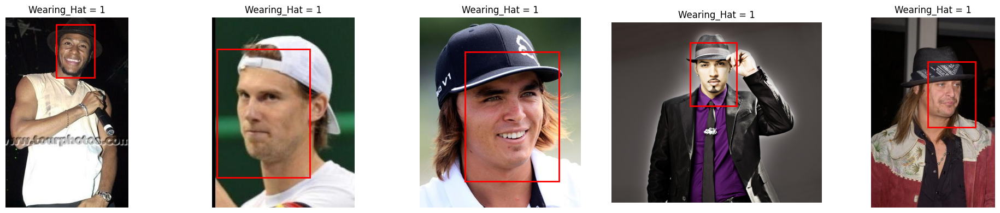

In [19]:
show_5_row_by_attribute(df, data_path, "Wearing_Hat", n = 5, seed = 21)

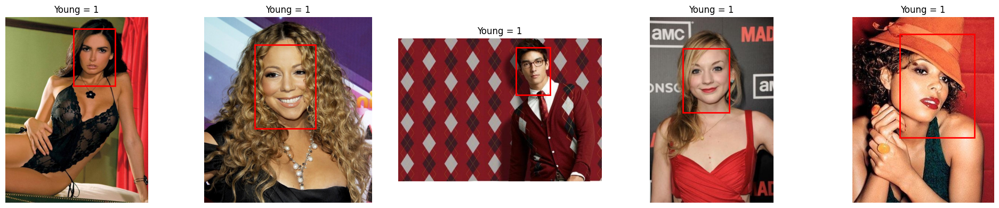

In [20]:
show_5_row_by_attribute(df, data_path, "Young", n = 5, seed = 2)

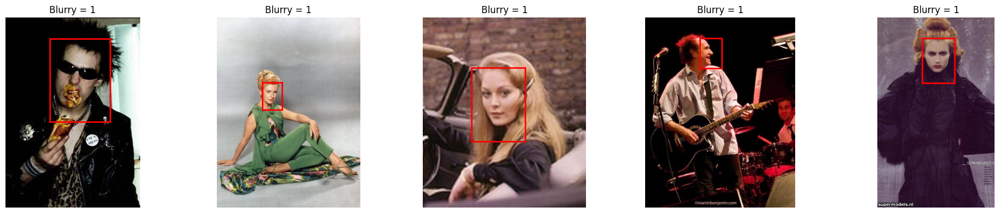

In [21]:
show_5_row_by_attribute(df, data_path, "Blurry", n = 5, seed = 2)

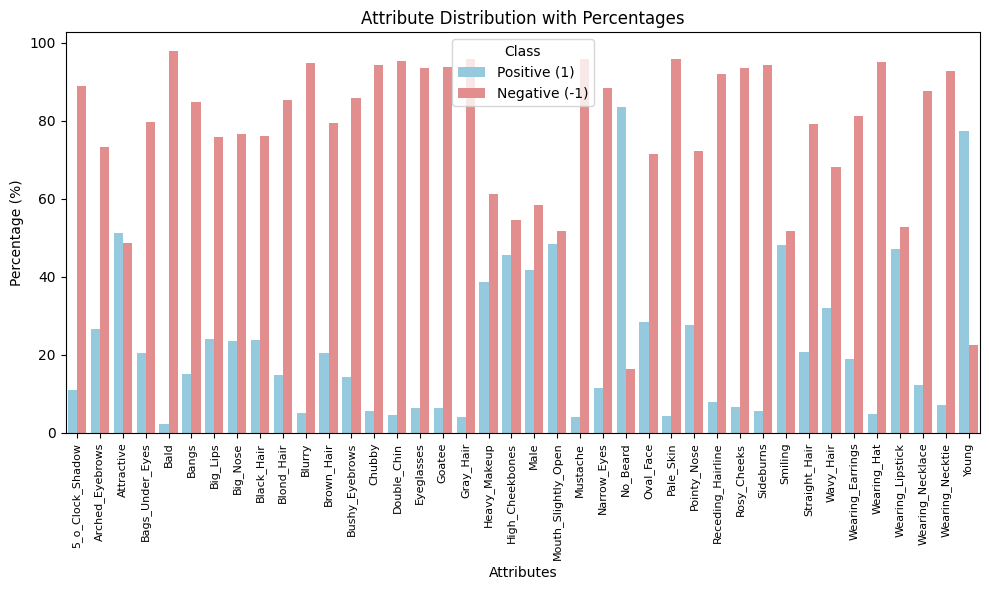

In [22]:
# отрисуем расперделение по аттрибутам
import seaborn as sns

plot_data = []
for c in attr_cols:
    num_pos = (df_attr[c] == 1).sum()
    num_neg = df_attr.shape[0] - num_pos
    total = num_pos + num_neg
    
    plot_data.append({
        'Attribute': c,
        'Class': 'Positive (1)',
        'Percentage': num_pos / total * 100
    })
    plot_data.append({
        'Attribute': c,
        'Class': 'Negative (-1)',
        'Percentage': num_neg / total * 100
    })

plot_df = pd.DataFrame(plot_data)

plt.figure(figsize=(10, 6))
sns.barplot(data=plot_df, x='Attribute', y='Percentage', hue='Class',
            palette={'Positive (1)': 'skyblue', 'Negative (-1)': 'lightcoral'})

plt.title('Attribute Distribution with Percentages')
plt.xlabel('Attributes')
plt.ylabel('Percentage (%)')
plt.xticks(rotation=90, fontsize=8)
plt.legend(title='Class')
plt.tight_layout()
plt.show()

Получилась не самая красивая картинка, но видно следующее:

1. все Blurry можно выкинуть, их всего 10к картинок
2. Male почти 50%, что хорошо
3. WearingHat, Eyeglasses составляют процентов 5, что тоже хорошо
4. Young кажется что многовато, но нестрашно
5. вцелом распеределение по аттрибутам выглядит разумным

In [23]:
# теперь посмотрим на статистику по bbox
df_bbox["width"].describe()

count    202599.000000
mean        194.754061
std         141.770066
min           0.000000
25%         120.000000
50%         164.000000
75%         221.000000
max        3827.000000
Name: width, dtype: float64

In [24]:
df_bbox["height"].describe()

count    202599.000000
mean        268.922329
std         195.664936
min           0.000000
25%         166.000000
50%         227.000000
75%         306.000000
max        5299.000000
Name: height, dtype: float64

Text(0.5, 1.0, 'Distribution of BBox Widths')

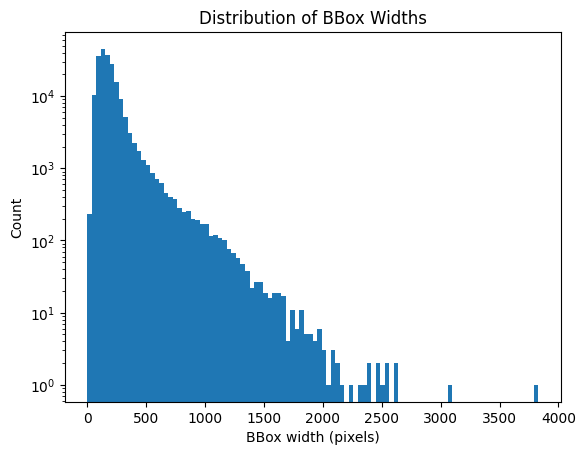

In [25]:
# отрисуем распраделения по ширине и высоте
plt.hist(df_bbox["width"], bins=100, log=True)
plt.xlabel("BBox width (pixels)")
plt.ylabel("Count")
plt.title("Distribution of BBox Widths")

Text(0.5, 1.0, 'Distribution of BBox Heights')

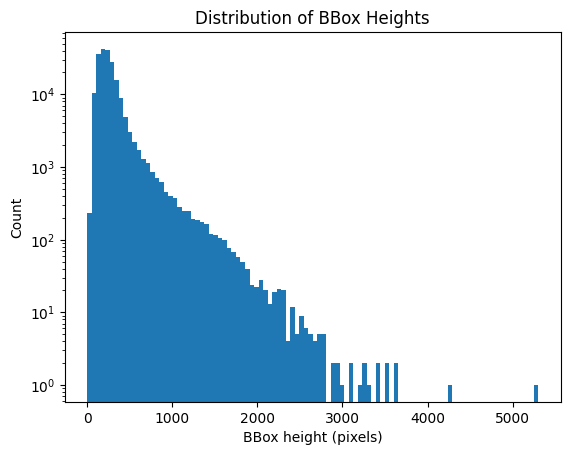

In [26]:
plt.hist(df_bbox["height"], bins=100, log=True)
plt.xlabel("BBox height (pixels)")
plt.ylabel("Count")
plt.title("Distribution of BBox Heights")

видно, что есть много изображений с маленькими bbox

In [27]:
df_bbox["area"] = df_bbox["width"] * df_bbox["height"]
df_bbox.head()

,image_id,x_1,y_1,width,height,area
0,000001.jpg,95,71,226,313,70738
1,000002.jpg,72,94,221,306,67626
2,000003.jpg,216,59,91,126,11466
3,000004.jpg,622,257,564,781,440484
4,000005.jpg,236,109,120,166,19920


Text(0.5, 1.0, 'Distribution of BBox Heights')

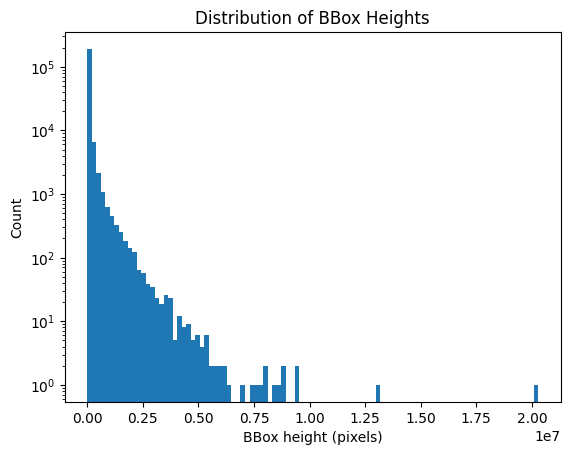

In [28]:
plt.hist(df_bbox["area"], bins=100, log=True)
plt.xlabel("BBox height (pixels)")
plt.ylabel("Count")
plt.title("Distribution of BBox Heights")

In [29]:
# отберем K самых маленьких и больших bbox по площади

K = 12

def sample_extremes(df, k):
    pool_mult = 10
    small_pool = df.sort_values("area").head(k * pool_mult)
    large_pool = df.sort_values("area", ascending=False).head(k * pool_mult)
    
    seed = 21

    small = small_pool.sample(n=min(k, len(small_pool)), random_state=seed)
    large = large_pool.sample(n=min(k, len(large_pool)), random_state=seed)
    return small.reset_index(drop=True), large.reset_index(drop=True)

small_df, large_df = sample_extremes(df_bbox, K)

small_df.head()

,image_id,x_1,y_1,width,height,area
0,164377.jpg,199,88,31,43,1333
1,058312.jpg,50,14,31,43,1333
2,042294.jpg,104,130,16,22,352
3,042638.jpg,26,28,26,36,936
4,039756.jpg,22,6,31,43,1333


In [30]:
from PIL import Image, ImageDraw

# функция для расширения bbox на заданный margin в процентах
def expand_bbox(x, y, w, h, img_w, img_h, margin):
    m = int(max(w, h) * margin)
    x1 = max(0, x - m)
    y1 = max(0, y - m)
    x2 = min(img_w, x + w + m)
    y2 = min(img_h, y + h + m)
    return x1, y1, x2, y2

def load_draw_and_crop(row, margin):

    image_id = str(row["image_id"])
    matches = list(data_path.rglob(image_id))
    img_path = matches[0]

    img = Image.open(img_path).convert("RGB")

    W, H = img.size
    
    # bbox
    x = int(row["x_1"]); y = int(row["y_1"])
    w = int(row["width"]); h = int(row["height"])
    
    x1, y1, x2, y2 = expand_bbox(x, y, w, h, W, H, margin)
    
    vis = img.copy()
    draw = ImageDraw.Draw(vis)
    draw.rectangle([x, y, x + w, y + h], outline="yellow", width=3)   # original bbox
    draw.rectangle([x1, y1, x2, y2], outline="red", width=3)          # bbox + margin
    
    crop = img.crop((x1, y1, x2, y2))
    return vis, crop

In [31]:
# отрисовка сетки изображений с bbox и кропами
def show_grid(rows_df, margin):
    n = len(rows_df)
    fig, axes = plt.subplots(n, 2, figsize=(9, 3*n))
    
    for i in range(n):
        row = rows_df.iloc[i]
        vis, crop = load_draw_and_crop(row, margin=margin)

        axes[i, 0].imshow(vis)
        axes[i, 0].axis("off")
        axes[i, 0].set_title(f"{row['image_id']}  w={row['width']} h={row['height']} area={row['area']}")

        axes[i, 1].imshow(crop)
        axes[i, 1].axis("off")
        axes[i, 1].set_title("Crop")

    plt.tight_layout()
    plt.show()

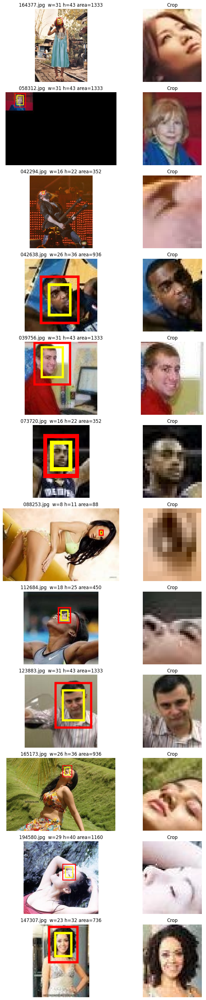

In [32]:
# отрисуем изображения с оригинальными bbox и увеличенными на margin и кропами
MARGIN = 0.25

show_grid(small_df, MARGIN)

так ну видно что картинки с слишком маленькими bbox надо выкидывать

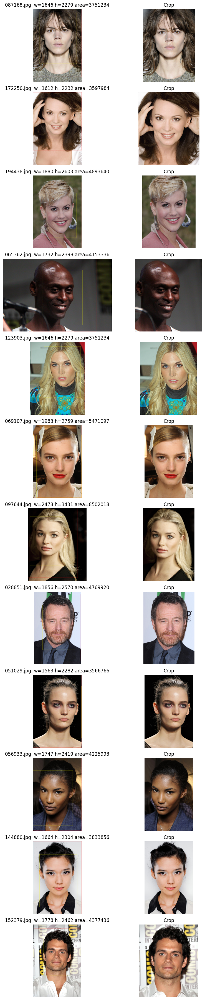

In [33]:
MARGIN = 0.25

show_grid(large_df, MARGIN)

с большими bbox проблем лет

In [34]:
# отфильтруем датасет по минимальным размерам bbox
MIN_BBOX_W = 100
MIN_BBOX_H = 100

df_min_bbox = df[(df["width"] >= MIN_BBOX_W) & (df["height"] >= MIN_BBOX_H)].copy()

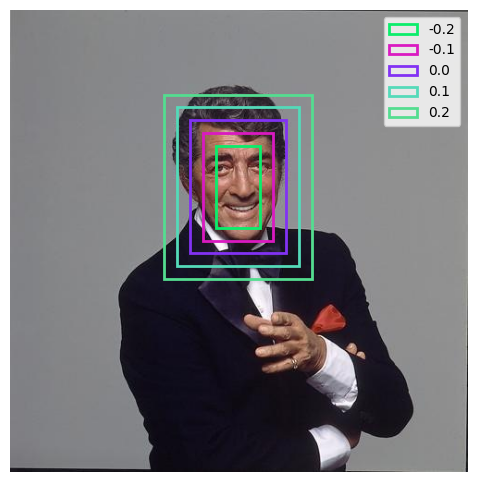

In [35]:
# тут я хотел поэкспериментировать с разными margin'ами для bbox
# чтобы понять насколько bbox нужно расширить или уменьшить
# чтобы захватить все лицо, но не слишком много лишнего фона
MARGIN = [-0.2, -0.1, 0.0, 0.1, 0.2]

def expand_bbox(x, y, w, h, img_w, img_h, margin):
    m = int(max(w, h) * margin)
    x1 = max(0, x - m)
    y1 = max(0, y - m)
    x2 = min(img_w, x + w + m)
    y2 = min(img_h, y + h + m)
    return x1, y1, x2, y2

random_idx = random.randint(0, df_min_bbox.shape[0] - 1)

row = df_min_bbox.iloc[random_idx]
image_id = str(row["image_id"])

matches = list(data_path.rglob(image_id))
img_path = matches[0]

img = Image.open(img_path).convert("RGB")
W, H = img.size

x = int(row["x_1"]); y = int(row["y_1"])
w = int(row["width"]); h = int(row["height"])

fig, ax = plt.subplots(figsize=(12, 6))

ax.imshow(img)

for margin in MARGIN:

    random_color = (random.random(), random.random(), random.random())
    x1, y1, x2, y2 = expand_bbox(x, y, w, h, W, H, margin)
    rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, linewidth=2, label = str(margin), color=random_color)
    ax.add_patch(rect)

ax.axis("off")
ax.legend()


видно что -10% изначального bbox может буть уже многовато, так что будем использовать -5%

(np.float64(-0.5), np.float64(344.5), np.float64(499.5), np.float64(-0.5))

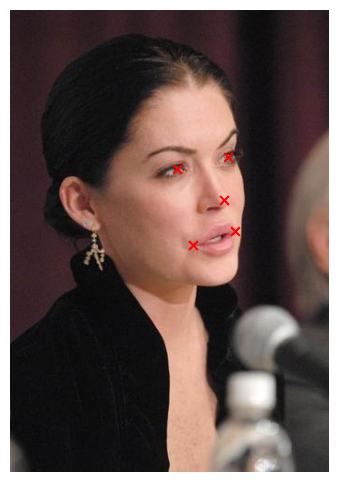

In [36]:
# возьмем рандомную картинку из отфильтрованного датасета и отрисуем с оригинальными landmark'ами
random_idx = 123
margin = 0

# находим строку в датафрейме по индексу
row = df_min_bbox.iloc[random_idx]
image_id = str(row["image_id"])

# находим путь до изображения
matches = list(data_path.rglob(image_id))
img_path = matches[0]

# открываем изображение
img = Image.open(img_path).convert("RGB")
W, H = img.size

# получаем bbox
x = int(row["x_1"]); y = int(row["y_1"])
w = int(row["width"]); h = int(row["height"])

fig, ax = plt.subplots(figsize=(12, 6))

x1, y1, x2, y2 = expand_bbox(x, y, w, h, W, H, margin)

# отрисовываем изображение
ax.imshow(img)

# отрисовываем landmark'ы
for name, (cx, cy) in landmarks.items():
    lx = int(row[cx])
    ly = int(row[cy])
    ax.scatter([lx], [ly], s=40, marker="x", linewidths=1.5, color = "red")

ax.axis("off")

(np.float64(-0.5), np.float64(184.5), np.float64(266.5), np.float64(-0.5))

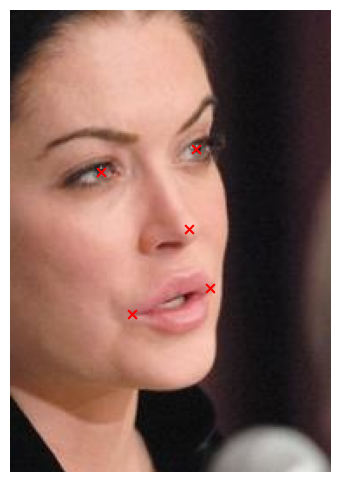

In [37]:
# теперь отрисуем то же самое, но с bbox расшириным на margin и картинкой обрезанной по этому bbox
margin = -0.05
random_idx = 123

def expand_bbox(x, y, w, h, img_w, img_h, margin):
    m = int(max(w, h) * margin)
    x1 = max(0, x - m)
    y1 = max(0, y - m)
    x2 = min(img_w, x + w + m)
    y2 = min(img_h, y + h + m)
    return x1, y1, x2, y2

row = df_min_bbox.iloc[random_idx]
image_id = str(row["image_id"])

matches = list(data_path.rglob(image_id))
img_path = matches[0]

img = Image.open(img_path).convert("RGB")
W, H = img.size

x = int(row["x_1"]); y = int(row["y_1"])
w = int(row["width"]); h = int(row["height"])

fig, ax = plt.subplots(figsize=(12, 6))

x1, y1, x2, y2 = expand_bbox(x, y, w, h, W, H, margin)
face = img.crop((x1, y1, x2, y2))
ax.imshow(face)

for name, (cx, cy) in landmarks.items():
    lx = int(row[cx])
    ly = int(row[cy])

    new_lx = lx - x1
    new_ly = ly - y1

    ax.scatter([new_lx], [new_ly], s=40, marker="x", linewidths=1.5, color = "red")

ax.axis("off")

все работает как надо